In [92]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from lenspack.geometry.projections import gnom 
from astropy.io import fits
from lenspack.utils import bin2d
from astropy.table import Table

# import matplotlib.gridspec as gridspec
# from skimage.measure import find_contours

# 
# from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
gt = np.load('/share/gpu0/jjwhit/kappa_cosmos_simulations/kappa_train/sim_00925.npy', allow_pickle=True)

In [3]:
cropped_gt = np.load('/share/gpu0/jjwhit/kappa_cosmos_simulations/cropped_dataset/kappa_val/cropped_sim_08771.npy', allow_pickle=True)

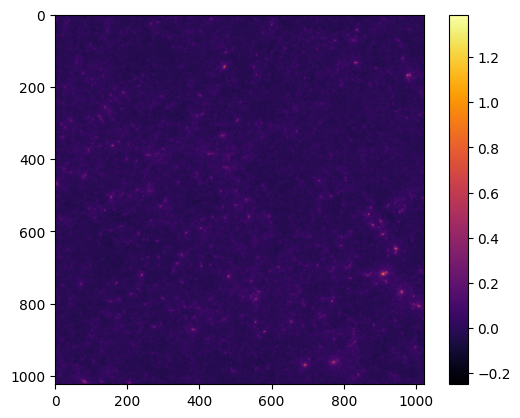

In [4]:
plt.imshow(gt, cmap='inferno')
plt.colorbar()
plt.show()

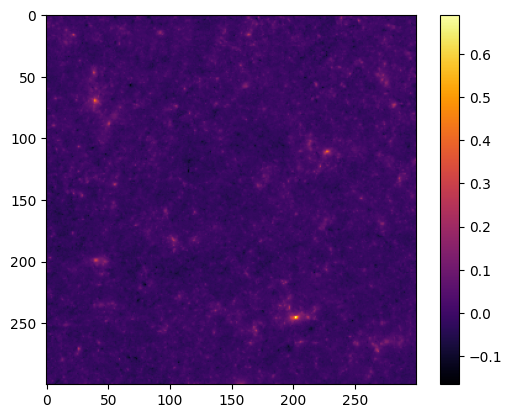

In [5]:
plt.imshow(cropped_gt, cmap='inferno')
plt.colorbar()
plt.show()

In [6]:
def compute_fourier_kernel(N: int) -> np.ndarray:
    """Computes the Fourier space kernel which represents the mapping between 
        convergence (kappa) and shear (gamma).

    Args:
        N (int): x,y dimension of image patch (assumes square images).

    Returns:
        D (np.ndarray): Fourier space Kaiser-Squires kernel, with shape = [N,N].
    """
    # Generate grid of Fourier domain
    kx = np.arange(N).astype(np.float64) - N/2
    ky, kx = np.meshgrid(kx, kx)
    k = kx**2 + ky**2
    # Define Kaiser-Squires kernel
    D = np.zeros((N, N), dtype=np.complex128)
    # D = np.where(k > 0, ((kx ** 2.0 - ky ** 2.0) + 1j * (2.0 * kx * ky))/k, D)
    # Another formulation to avoid divide by zero warning
    D[k>0] = (((kx ** 2.0 - ky ** 2.0) + 1j * (2.0 * kx * ky))[k>0]/k[k>0])
    # Apply inverse FFT shift 
    return np.fft.ifftshift(D)


def forward_model(kappa: np.ndarray, D: np.ndarray) -> np.ndarray:
    """Applies the forward mapping between convergence and shear through their 
        relationship in Fourier space.

    Args:
        kappa (np.ndarray): Convergence field, with shape [N,N].
        D (np.ndarray): Fourier space Kaiser-Squires kernel, with shape = [N,N].

    Returns:
        gamma (np.ndarray): Shearing field, with shape [N,N].
    """
    F_kappa = np.fft.fft2(kappa) # Perform 2D forward FFT
    F_gamma = F_kappa * D # Map convergence onto shear
    return np.fft.ifft2(F_gamma) # Perform 2D inverse FFT

In [7]:
kernel = compute_fourier_kernel(1024)
cropped_kernel = compute_fourier_kernel(300)

In [8]:
shear = forward_model(gt, kernel)
cropped_shear = forward_model(cropped_gt, cropped_kernel)

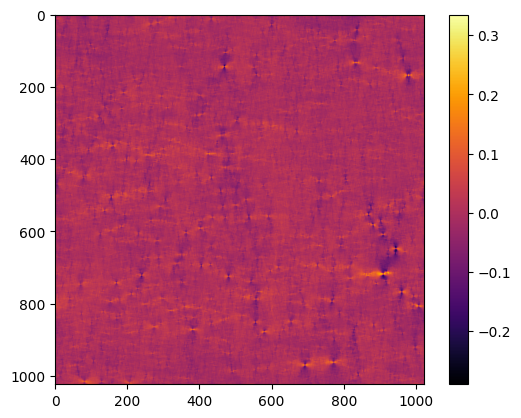

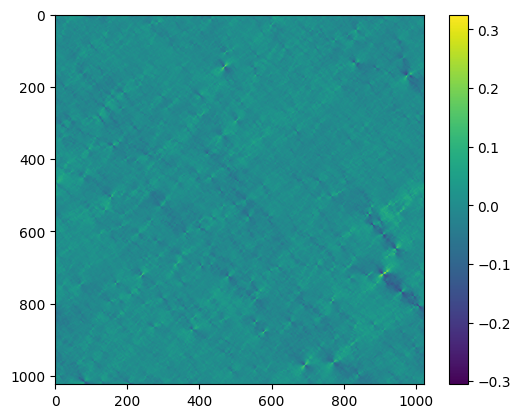

In [9]:
plt.imshow(np.real(shear), cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(shear.imag, cmap='viridis')
plt.colorbar()
plt.show()

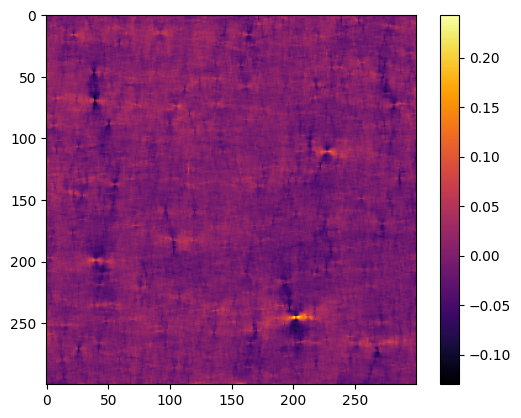

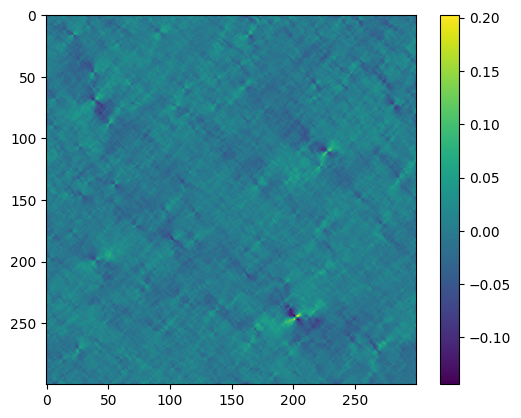

In [10]:
plt.imshow(cropped_shear.real, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(cropped_shear.imag, cmap='viridis')
plt.colorbar()
plt.show()

In [11]:
def ks93(g1, g2):
    # Check consistency of input maps
    assert g1.shape == g2.shape

    # Compute Fourier space grids
    (nx, ny) = g1.shape
    k1, k2 = np.meshgrid(np.fft.fftfreq(ny), np.fft.fftfreq(nx))

    # Compute Fourier transforms of g1 and g2
    g1hat = np.fft.fft2(g1)
    g2hat = np.fft.fft2(g2)

    # Apply Fourier space inversion operator
    p1 = k1 * k1 - k2 * k2
    p2 = 2 * k1 * k2
    k2 = k1 * k1 + k2 * k2
    k2[0, 0] = 1  # avoid division by 0
    kEhat = (p1 * g1hat + p2 * g2hat) / k2
    kBhat = -(p2 * g1hat - p1 * g2hat) / k2

    # Transform back to pixel space
    kE = np.fft.ifft2(kEhat).real
    kB = np.fft.ifft2(kBhat).real

    return kE, kB



def backward_model(γ: np.ndarray, 𝒟: np.ndarray) -> np.ndarray:
  """Applies the backward mapping between shear and convergence through their 
    relationship in Fourier space.
  Args:
    γ (np.ndarray): Shearing field, with shape [N,N].
    𝒟 (np.ndarray): Fourier space Kaiser-Squires kernel, with shape = [N,N].
  Returns:
    𝜅 (np.ndarray): Convergence field, with shape [N,N].
  """
  𝓕γ = np.fft.fft2(γ) # Perform 2D forward FFT
  𝓕𝜅 = 𝓕γ / 𝒟 # Map convergence onto shear
  𝓕𝜅 = np.nan_to_num(𝓕𝜅, nan=0, posinf=0, neginf=0) # Remove singularities
  return np.fft.ifft2(𝓕𝜅) # Perform 2D inverse FFT


In [12]:
kappa93 = ks93(shear.real, shear.imag)
cropped_kappa93 = ks93(cropped_shear.real, cropped_shear.imag)

In [13]:
kappa_backward = backward_model(shear, kernel)
cropped_kappa_backward = backward_model(cropped_shear, cropped_kernel)

/tmp/ipykernel_99447/1148532874.py:39: RuntimeWarning: divide by zero encountered in divide
  𝓕𝜅 = 𝓕γ / 𝒟 # Map convergence onto shear


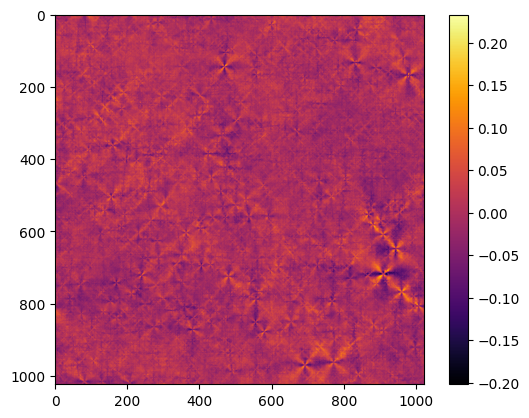

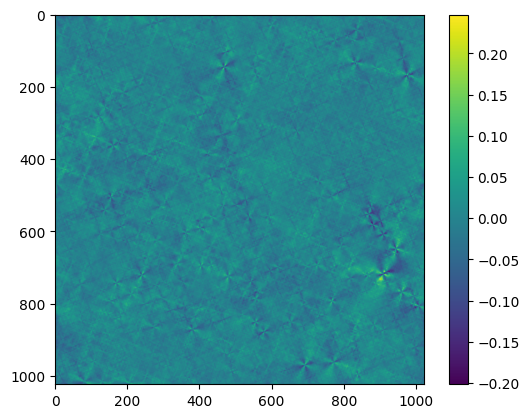

In [14]:
plt.imshow(kappa93[0], cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(kappa93[1], cmap='viridis')
plt.colorbar()
plt.show()

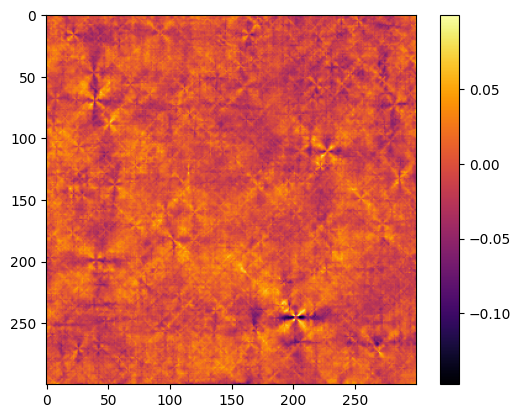

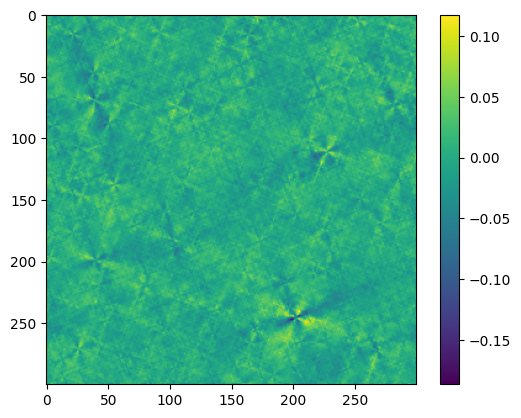

In [15]:
plt.imshow(cropped_kappa93[0], cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(cropped_kappa93[1], cmap='viridis')
plt.colorbar()
plt.show()

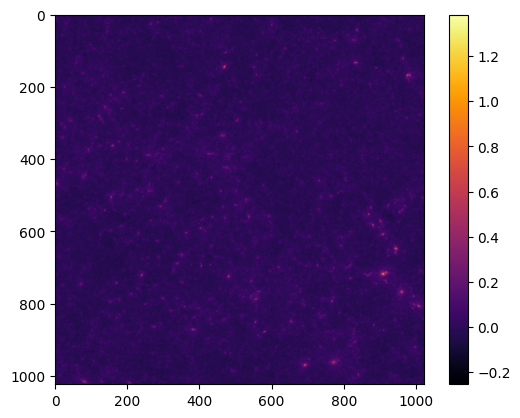

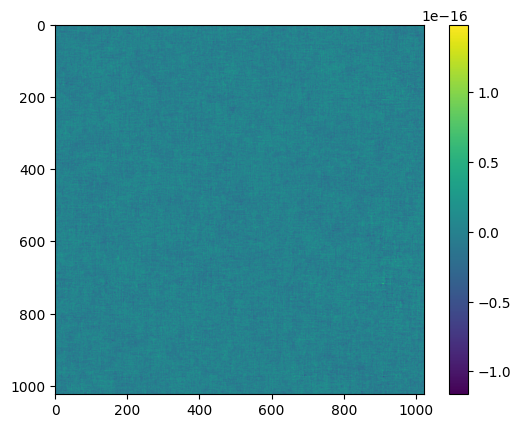

In [16]:
plt.imshow(kappa_backward.real, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(kappa_backward.imag, cmap='viridis')
plt.colorbar()
plt.show()


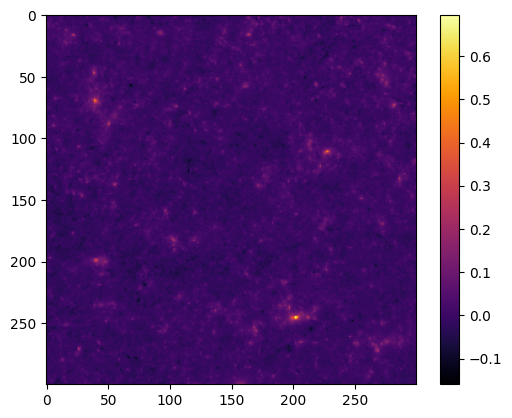

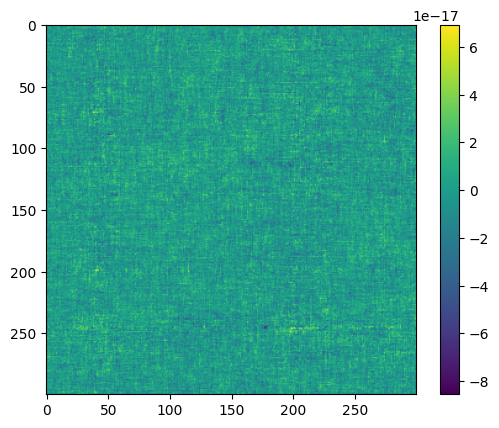

In [17]:
plt.imshow(cropped_kappa_backward.real, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(cropped_kappa_backward.imag, cmap='viridis')
plt.colorbar()
plt.show()

It appears ks93 and the backward model are not doing the same thing - make sure I'm using the backward model in our work.

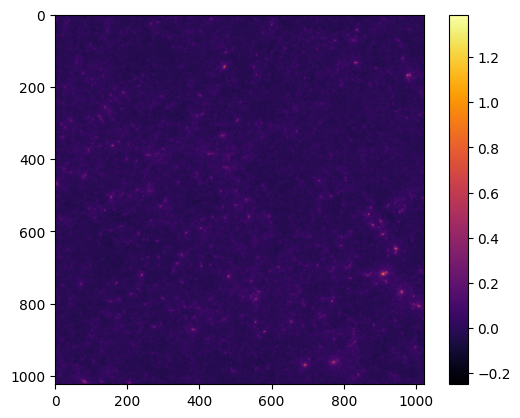

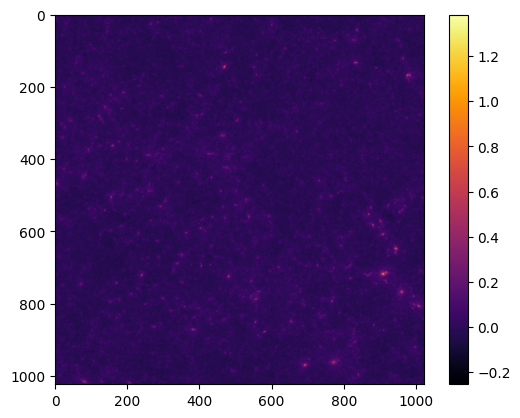

In [18]:
plt.imshow(gt, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(kappa_backward.real, cmap='inferno')
plt.colorbar()
plt.show()

### Now let's try adding noise to the shear and seeing how that affects the backward model results.

In [19]:
#Note we are using a simpler version of the noise, for these preliminary tests.
def gamma_noise_maker(theta: float, im_size: int, kappa: np.ndarray,ngal=30) -> np.ndarray:
    """Adds some random Gaussian noise to a mock weak lensing map.

    Args:
        theta (float): Opening angle in deg.
        im_size (int): Size of weak lensing map, in pixels.
        ngal (int): Number of galaxies.
        kappa (np.ndarray): Convergence map.
    
    Returns:
        gamma (np.ndarray): A synthetic representation of the shear field, gamma, with added noise.
    """
    D = compute_fourier_kernel(im_size) #Fourier kernel
    sigma = 0.37 / np.sqrt(((theta*60/im_size)**2)*ngal)
    gamma = forward_model(kappa, D) + sigma*(np.random.randn(im_size,im_size) + 1j * np.random.randn(im_size,im_size))
    return gamma

In [20]:
noisy_shear = gamma_noise_maker(5.0, 1024, gt)
cropped_noisy_shear = gamma_noise_maker(5.0, 300, cropped_gt)

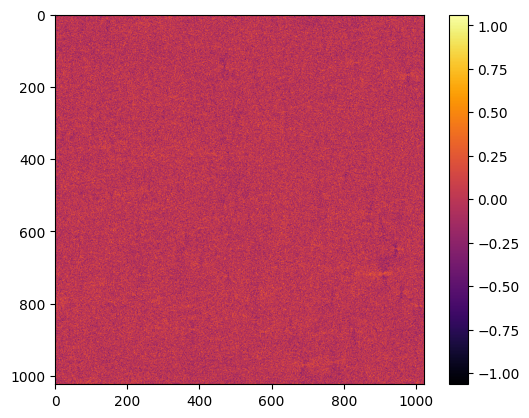

In [21]:
plt.imshow(noisy_shear.real, cmap='inferno')
plt.colorbar()
plt.show()

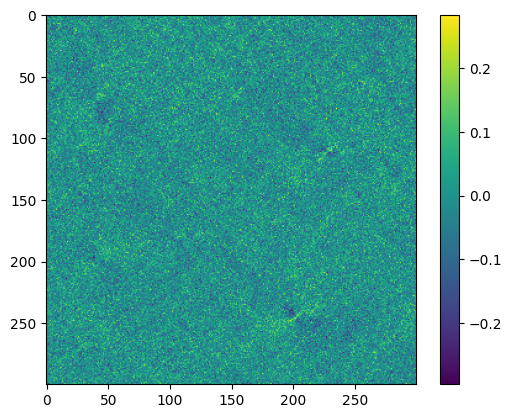

In [22]:
plt.imshow(cropped_noisy_shear.imag, cmap='viridis')
plt.colorbar()
plt.show()

In [23]:
noisy_kappa = backward_model(noisy_shear, kernel)
cropped_noisy_kappa = backward_model(cropped_noisy_shear, cropped_kernel)

/tmp/ipykernel_99447/1148532874.py:39: RuntimeWarning: divide by zero encountered in divide
  𝓕𝜅 = 𝓕γ / 𝒟 # Map convergence onto shear


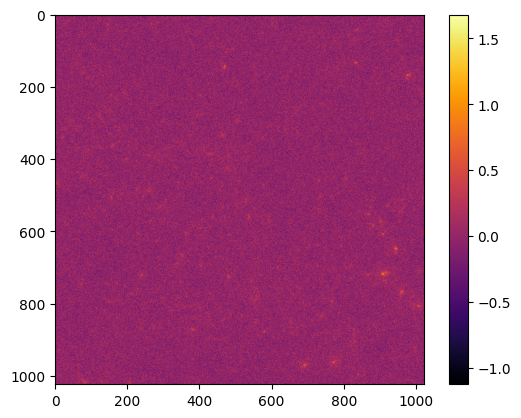

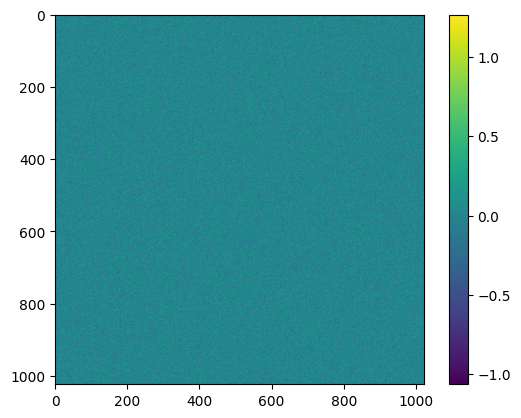

In [24]:
plt.imshow(noisy_kappa.real, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(noisy_kappa.imag, cmap='viridis')
plt.colorbar()
plt.show()

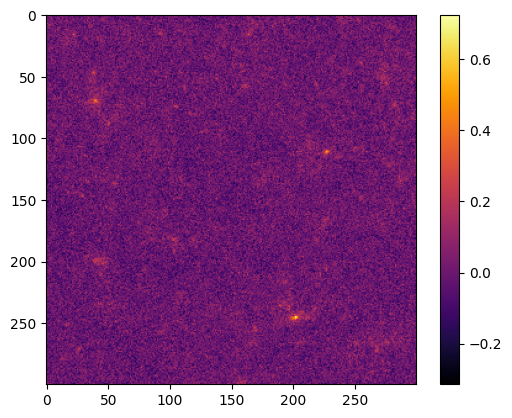

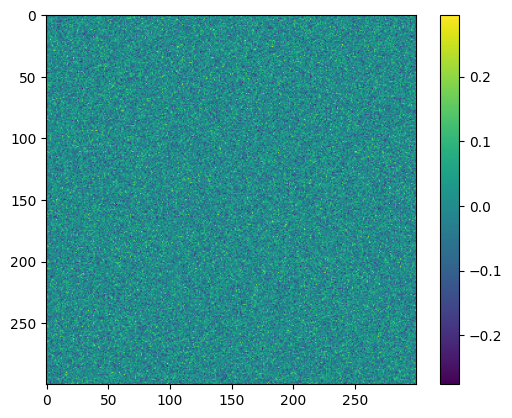

In [25]:
plt.imshow(cropped_noisy_kappa.real, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(cropped_noisy_kappa.imag, cmap='viridis')
plt.colorbar()
plt.show()
#Results are as expected.

In [ ]:
#Now to apply Gaussian smoothing.

In [26]:
scipy_kappa = ndimage.gaussian_filter(gt, sigma=1)

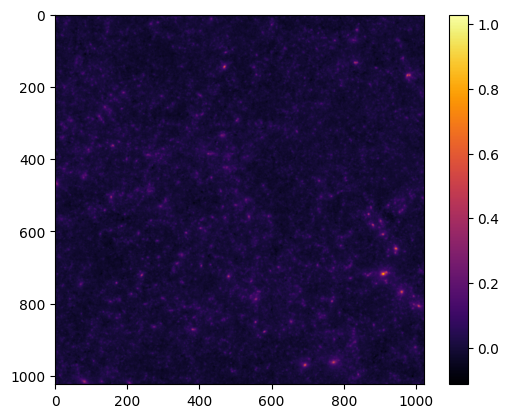

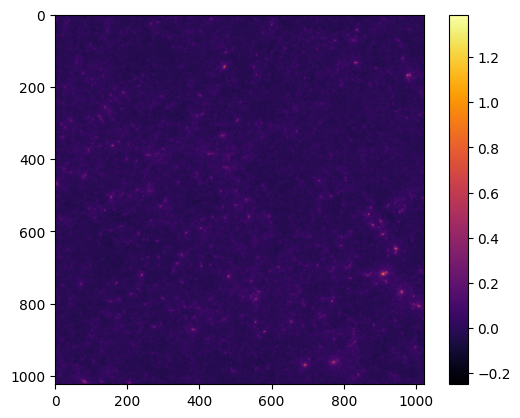

In [27]:
plt.imshow(scipy_kappa, cmap='inferno')
plt.colorbar()
plt.show()
plt.imshow(gt, cmap='inferno')
plt.colorbar()
plt.show()

In [82]:
pw_diff = np.abs(gt - scipy_kappa)

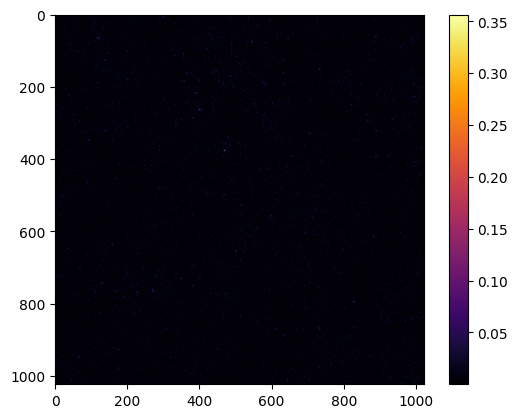

In [83]:
plt.imshow(pw_diff, cmap='inferno')
plt.colorbar()
plt.show()

In [28]:
def Gaussian_smoothing(kappa:np.ndarray,n:int,theta:float,epsilon=25) -> np.ndarray:
    """Applies Gaussian smoothing to a convergence map.

    This is done by taking Fourier transform of the convergence map, and a Gaussian,
    convolving them, and then applying an inverse Fourier transform to the result.

    Args:
        kappa (np.ndarray): Convergence map.
        n (int): The dimensions, in pixels, of a square map kappa, where n x n is the no. of pixels in kappa.
        theta (float): Opening angle in deg.
        epsilon (int): Smoothing scale.

    Returns:
        smoothed_kappa (np.ndarray): Returns a smoothed representation of the the convergence field.
    """
    kappa_f = np.fft.fft2(kappa) #Fourier transform of kappa
    kappa_f_shifted = np.fft.fftshift(kappa_f) #Changes the indexing of the Fourier coefficients
    
    Gaussian_filter = np.zeros((n,n))
    i = (epsilon*n)/(60*theta)
    sig_pix = i/(2*np.sqrt(2*np.log(2)))

    t = int(n/2)
    y = np.arange(-t,t)
    xx,yy = np.meshgrid(y,y)

    exponential = np.exp(-(xx**2 + yy**2)*2*(sig_pix*np.pi)**2)
    Gaussian_filter = exponential

    smoothed_kappa_f = np.fft.ifftshift(kappa_f_shifted*Gaussian_filter)
    smoothed_kappa = np.fft.ifft2(smoothed_kappa_f)
    return smoothed_kappa

In [29]:
manual_kappa = Gaussian_smoothing(gt, 1024, 5.0)

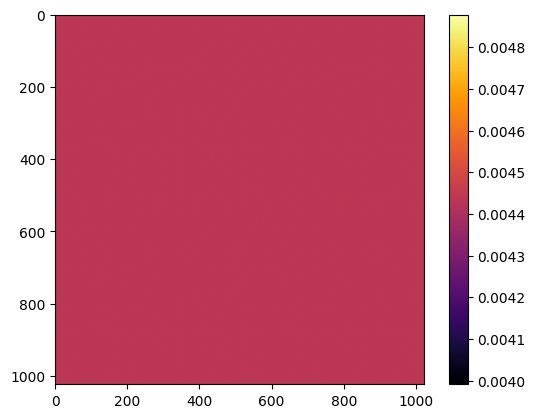

In [30]:
plt.imshow(manual_kappa.real, cmap='inferno')
plt.colorbar()
plt.show()

### Testing on more realistic noise

In [31]:
std1 = np.load(
    '/home/jjwhit/rcGAN/mass_map_utils/cosmos/cosmos_std1.npy', allow_pickle=True
)
std2 = np.load(
    '/home/jjwhit/rcGAN/mass_map_utils/cosmos/cosmos_std2.npy', allow_pickle=True
)

In [32]:
def realistic_noise_maker(kappa, im_size) -> np.ndarray:
    """
    Args:
        im_size (int): Size of weak lensing map, in pixels.
        kappa (np.ndarray): Convergence map.
    
    Returns:
        gamma (np.ndarray): A synthetic representation of the shear field, gamma, with added noise.
    """

    D = compute_fourier_kernel(im_size) #Fourier kernel
    gamma = forward_model(kappa, D) + (
        std1 * np.random.randn(im_size, im_size) + 1.j * std2 * np.random.randn(im_size, im_size)
    )
    return gamma

In [33]:
cropped_realistic_shear = realistic_noise_maker(cropped_gt,300)

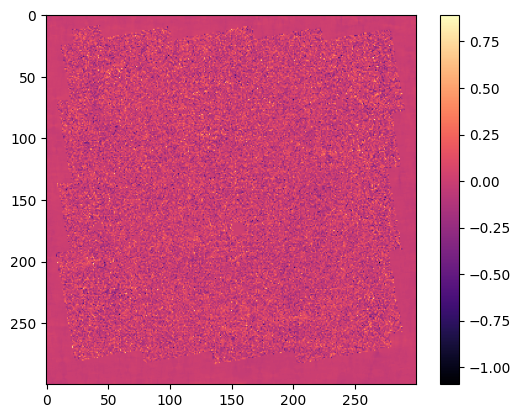

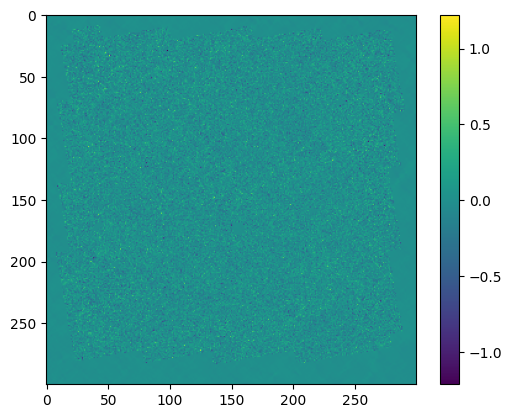

In [34]:
plt.imshow(cropped_realistic_shear.real, cmap='magma')
plt.colorbar()
plt.show()
plt.imshow(cropped_realistic_shear.imag, cmap='viridis')
plt.colorbar()
plt.show()

In [35]:
realistic_estimation = backward_model(cropped_realistic_shear, cropped_kernel)

/tmp/ipykernel_99447/1148532874.py:39: RuntimeWarning: divide by zero encountered in divide
  𝓕𝜅 = 𝓕γ / 𝒟 # Map convergence onto shear


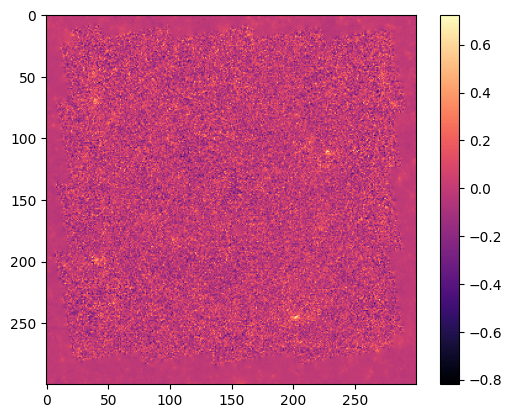

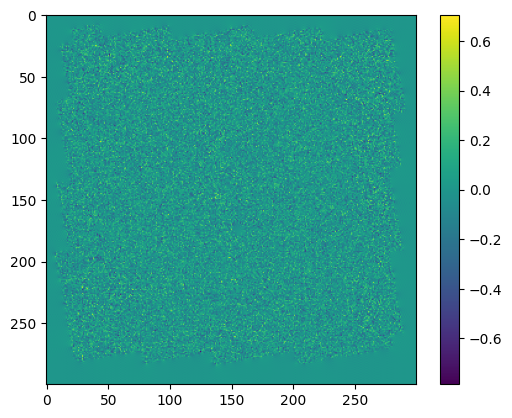

In [36]:
plt.imshow(realistic_estimation.real, cmap='magma')
plt.colorbar()
plt.show()

plt.imshow(realistic_estimation.imag, cmap='viridis')
plt.colorbar()
plt.show()

In [37]:
#Now to smooth
smoothed_estimation = ndimage.gaussian_filter(realistic_estimation, sigma=1/.29)

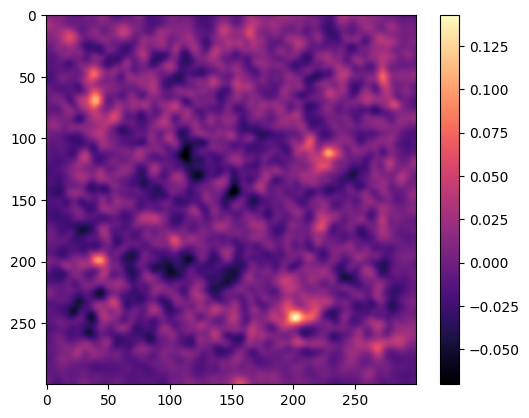

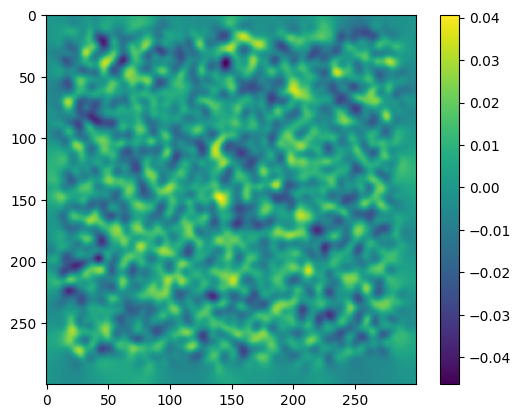

In [38]:
plt.imshow(smoothed_estimation.real, cmap='magma')
plt.colorbar()
plt.show()

plt.imshow(smoothed_estimation.imag, cmap='viridis')
plt.colorbar()
plt.show()

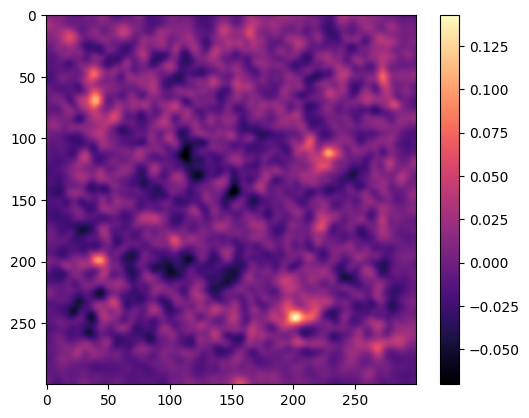

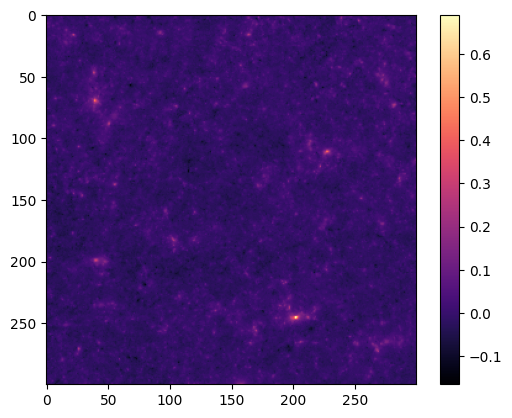

In [39]:
plt.imshow(smoothed_estimation.real, cmap='magma')
plt.colorbar()
plt.show()

plt.imshow(cropped_gt, cmap='magma')
plt.colorbar()
plt.show()

Features appear in the same places, Kaiser-Squires with  scipy smoothing is giving sensible results for realistic noise too.

### Finally, testing on COSMOS data

In [72]:
#Load the cropped cosmos shear and shear magnitude- which is a real measurement with noise
cropped_cosmos_shear = np.load('/home/jjwhit/rcGAN/mass_map_utils/cosmos/cosmos_shear_cropped.npy', allow_pickle=True)

mask = np.load('/home/jjwhit/rcGAN/mass_map_utils/cosmos/cosmos_mask.npy', allow_pickle=True)

#Load the Remy result
remy_result = fits.getdata('/share/gpu0/jjwhit/remy2022_results/cosmos/dlp_cosmos_mean_hdu.fits')
start_row = (remy_result.shape[0] - 300) // 2
start_col = (remy_result.shape[1] - 300) // 2

# Extract the center 300x300 portion
remy_resized = remy_result[start_row:start_row + 300, start_col:start_col + 300]

In [73]:
#TODO: Check cosmos shear (x2) shape - (300,300) or (1,2,300,300) - use test_cosmos_plot.ipynb if required
cropped_cosmos_shear.shape

(300, 300)

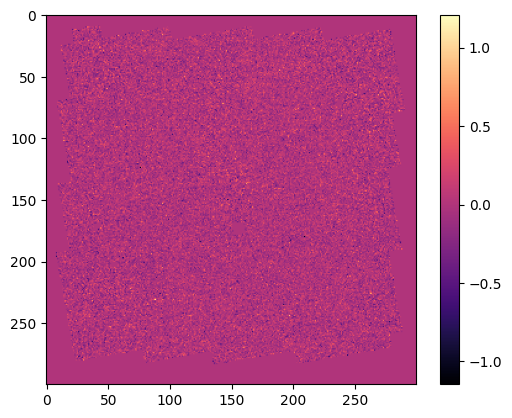

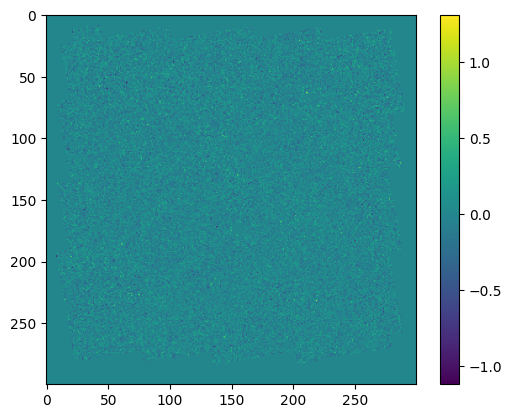

In [74]:
plt.imshow(cropped_cosmos_shear.real,cmap='magma')
plt.colorbar()
plt.show()

plt.imshow(cropped_cosmos_shear.imag,cmap='viridis')
plt.colorbar()
plt.show()

In [75]:
COSMOS_VERTICES = [(149.508, 2.880),
                   (149.767, 2.836),
                   (149.780, 2.887),
                   (150.040, 2.842),
                   (150.051, 2.893),
                   (150.363, 2.840),
                   (150.376, 2.890),
                   (150.746, 2.826),
                   (150.737, 2.774),
                   (150.790, 2.765),
                   (150.734, 2.449),
                   (150.787, 2.441),
                   (150.730, 2.125),
                   (150.785, 2.118),
                   (150.758, 2.013),
                   (150.768, 2.010),
                   (150.747, 1.910),
                   (150.799, 1.897),
                   (150.740, 1.580),
                   (150.481, 1.625),
                   (150.466, 1.572),
                   (150.211, 1.619),
                   (150.196, 1.567),
                   (149.887, 1.621),
                   (149.872, 1.571),
                   (149.617, 1.615),
                   (149.602, 1.566),
                   (149.493, 1.584),
                   (149.504, 1.637),
                   (149.450, 1.646),
                   (149.488, 1.855),
                   (149.433, 1.862),
                   (149.491, 2.178),
                   (149.436, 2.186),
                   (149.484, 2.445),
                   (149.431, 2.455),
                   (149.508, 2.880)]

In [76]:
def get_extend_radec(res, width):
    ra0, dec0 = (150.11, 2.24) # from cosmos.astro.caltech.edu (could also just use the medians of positions)
    proj = gnom.projector(ra0, dec0)
    pix_size = res #arcmin
    dx = np.deg2rad(width*pix_size/60./2) # number of degrees across
    dy = dx
    extent_xy = [-dx, dx, -dy, dy]
    ra_min, dec_min = proj.xy2radec(-dx, -dy)
    ra_max, dec_max = proj.xy2radec(dx, dy)
    extent_radec = [ra_min, ra_max, dec_min, dec_max]
    return extent_radec

In [77]:
#Apply the backward model to the cosmos data - this will give the Kaiser-Squires reconstruction

cosmos_ks = backward_model(cropped_cosmos_shear, cropped_kernel)

/tmp/ipykernel_99447/1148532874.py:39: RuntimeWarning: divide by zero encountered in divide
  𝓕𝜅 = 𝓕γ / 𝒟 # Map convergence onto shear


In [78]:
width = 300
resolution = 0.29
ra, dec = np.array(COSMOS_VERTICES).T

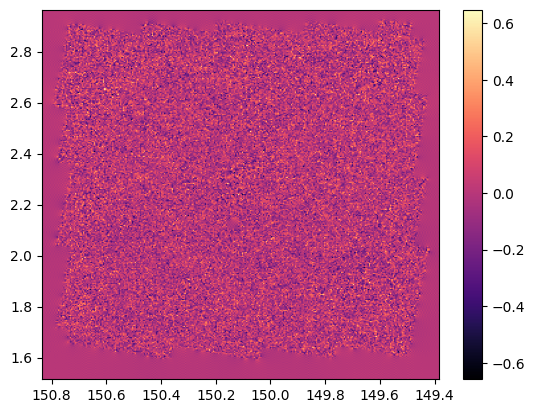

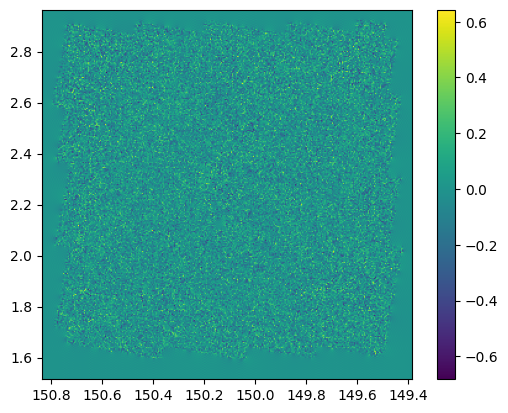

In [79]:
ax = plt.imshow(cosmos_ks.real, cmap='magma', extent=get_extend_radec(resolution,  width), aspect='auto')
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()
ax =  plt.imshow(cosmos_ks.imag, cmap='viridis', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

In [114]:
#Apply scipy Gaussian smoothing
cosmos_smoothed = ndimage.gaussian_filter(cosmos_ks, sigma=1/.29)

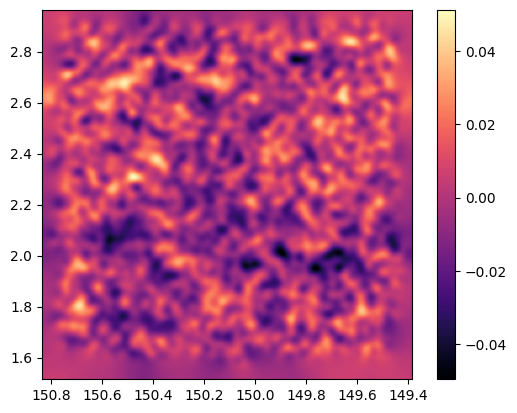

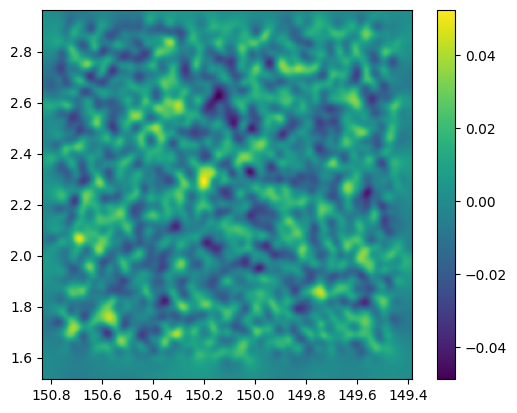

In [115]:
ax = plt.imshow(cosmos_smoothed.real, cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()
ax = plt.imshow(cosmos_smoothed.imag, cmap='viridis', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

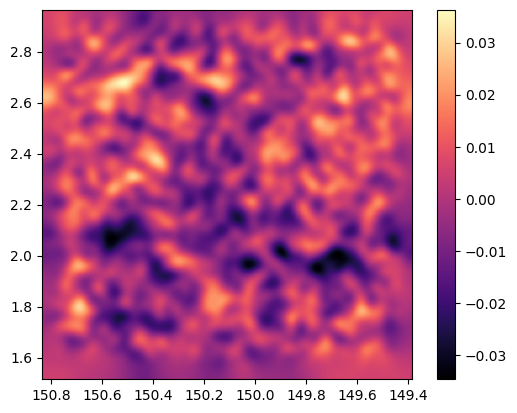

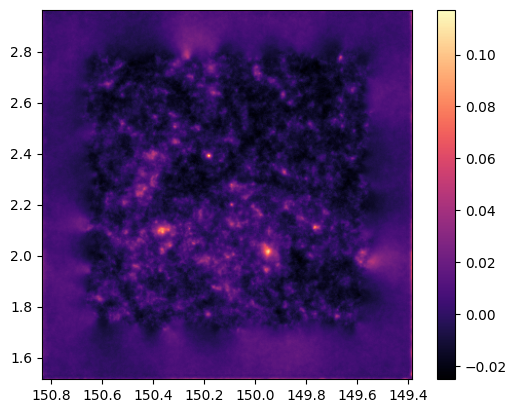

In [86]:
ax = plt.imshow(cosmos_smoothed.real, cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()
ax = plt.imshow(remy_result, cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

Results do not look comparable in this case - next step: check how the cosmos shear was built, and if there are any errors therein.
Test 1: Compare kaiser-squires reconstruction  from here with Remy Kaiser-Squires reconstruction. 

In [96]:
cat_bright = Table.read('/share/gpu0/jjwhit/COSMOS_v1/cosmos_bright_cat_min.asc', format='ascii')
cat_faint = Table.read('/share/gpu0/jjwhit/COSMOS_v1/cosmos_faint_cat.asc', format='ascii')

In [97]:
cat_full = Table()
cat_full['Ra'] = np.concatenate([cat_bright['Ra'], cat_faint['Ra']])
cat_full['Dec'] = np.concatenate([cat_bright['Dec'], cat_faint['Dec']])
cat_full['e1iso_rot4_gr_snCal'] = np.concatenate([cat_bright['e1iso_rot4_gr_snCal'], cat_faint['e1iso_rot4_gr_snCal']])
cat_full['e2iso_rot4_gr_snCal'] = np.concatenate([cat_bright['e2iso_rot4_gr_snCal'], cat_faint['e2iso_rot4_gr_snCal']])
cat_full['nhweight_int'] = np.concatenate([cat_bright['nhweight_int'], cat_faint['nhweight_int']])

In [105]:
resolution = 0.29
width = 300
size = width * resolution / 60.
ra = np.median(cat_full['Ra'])
dec = np.median(cat_full['Dec'])
extent = [ra - size/2, ra + size/2, dec - size/2, dec + size/2]

In [106]:
e1map, e2map = bin2d(cat_full['Ra'], cat_full['Dec'], 
                     v=(cat_full['e1iso_rot4_gr_snCal'], cat_full['e2iso_rot4_gr_snCal']), 
                     w=cat_full['nhweight_int'],
                     npix=width,
                     extent=extent)rbar()

In [109]:
kappaE, kappaB = ks93(e1map, -e2map)

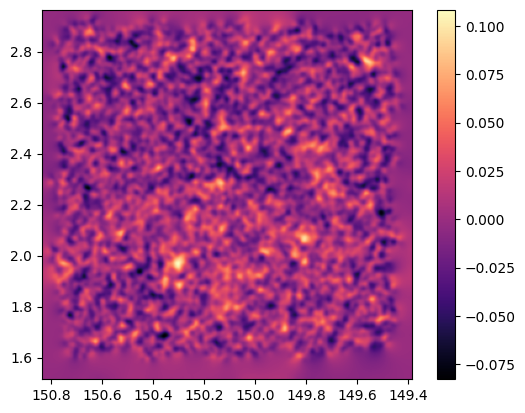

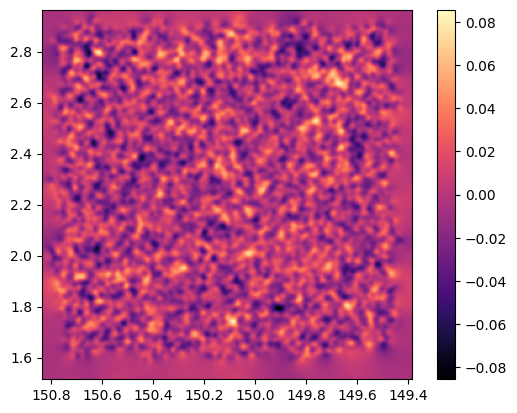

In [113]:
ax = plt.imshow(ndimage.gaussian_filter(kappaE,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()
ax = plt.imshow(ndimage.gaussian_filter(kappaB,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

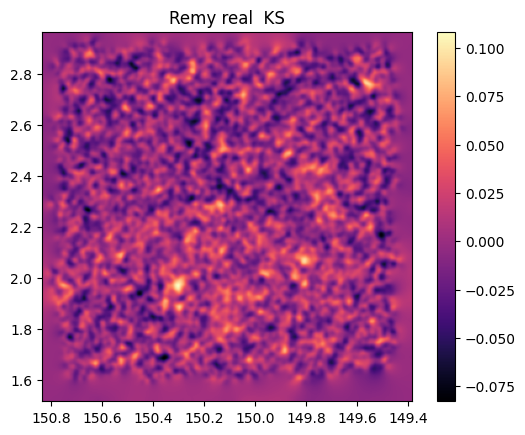

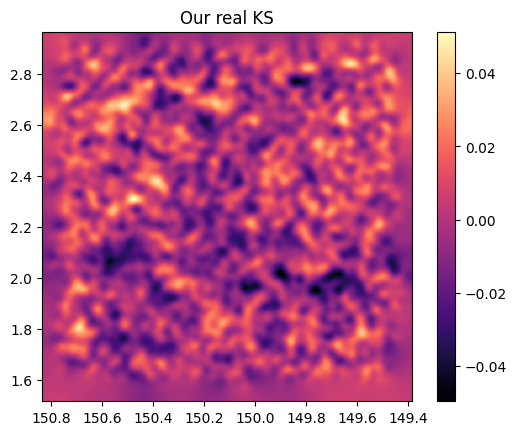

In [119]:
ax = plt.imshow(ndimage.gaussian_filter(kappaE,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.title('Remy real  KS')
plt.show()
ax = plt.imshow(cosmos_smoothed.real, cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.title('Our real KS')
plt.colorbar()
plt.show()

In [120]:
ks_diff = np.abs(ndimage.gaussian_filter(kappaE,2)[:,::-1] - cosmos_smoothed.real)

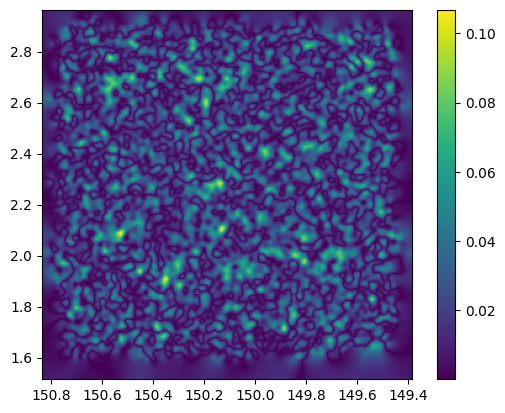

In [131]:
#The difference between the two results
ax =plt.imshow(ks_diff, extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

In [128]:
test1r, test1i=ks93(cropped_cosmos_shear.real, cropped_cosmos_shear.imag)

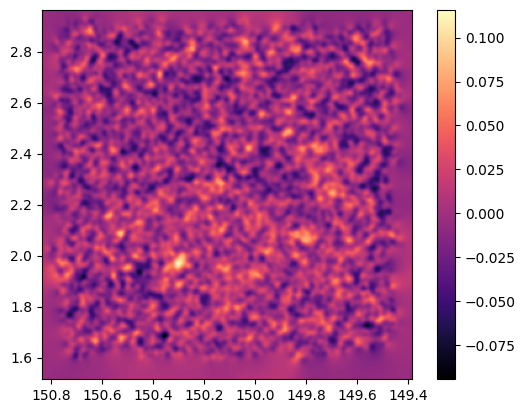

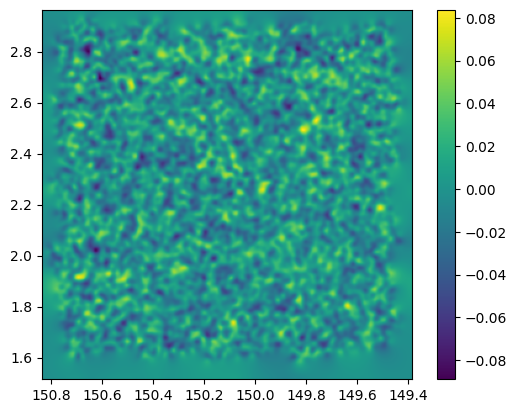

In [134]:
ax = plt.imshow(ndimage.gaussian_filter(test1r,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()
ax = plt.imshow(ndimage.gaussian_filter(test1i,2)[:,::-1], cmap='viridis', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

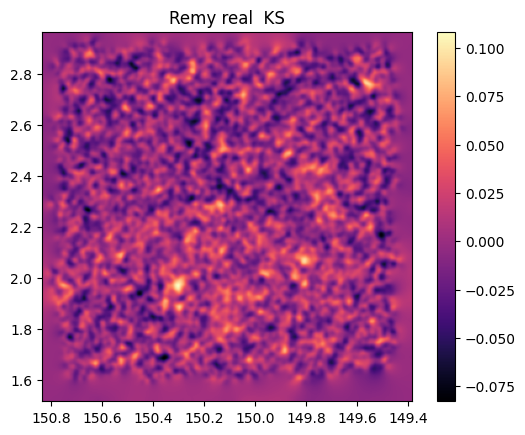

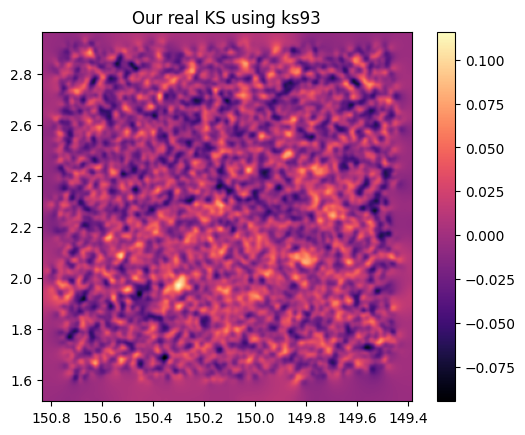

In [138]:
ax = plt.imshow(ndimage.gaussian_filter(kappaE,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.title('Remy real  KS')
plt.show()
ax = plt.imshow(ndimage.gaussian_filter(test1r,2)[:,::-1], cmap='magma', extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.title('Our real KS using ks93')
plt.colorbar()
plt.show()

In [139]:
test_diff = np.abs(ndimage.gaussian_filter(kappaE,2)[:,::-1] - ndimage.gaussian_filter(test1r,2)[:,::-1])

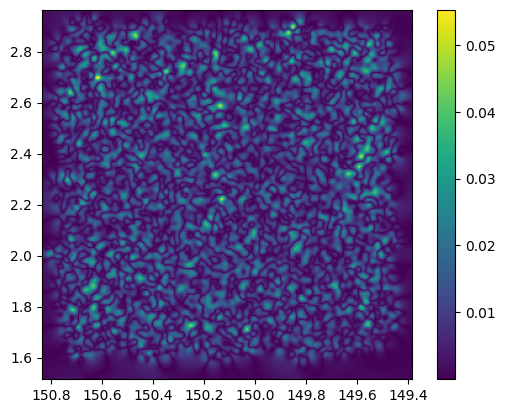

In [140]:
ax =plt.imshow(test_diff, extent=get_extend_radec(resolution,  width))
ax.axes.invert_xaxis()
plt.colorbar()
plt.show()

In [ ]:
#cropped_cosmos_shear; (e1map, e2map)